**This notebook shows how RF predits runoff extremes with precipitation, evaporation, surface soil moisture. <br/>**

By Jialu Wang

Reference: https://github.com/leap-stc/EAEE4000_ML_EnvEng/blob/main/Tutorials/RF_example.ipynb

In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import xarray as xr
from glob import glob


from sklearn.ensemble import RandomForestRegressor 
from sklearn.model_selection import RandomizedSearchCV
from utils import * 

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
%load_ext autoreload
%autoreload 2

plt.rcParams['savefig.dpi'] = 400
plt.rcParams['font.size'] = 13
plt.rcParams["legend.frameon"] = False

### Data preprocssing: prepare predictors and predictand data

In [3]:
for file in os.listdir('.'):
    print(f" - {file}")

 - ._camels_01620500.nc
 - .ipynb_checkpoints
 - ERA5-LAND.nc
 - utils.py
 - __pycache__
 - ._camels_01644000.nc
 - ._camels_02015700.nc
 - RF.ipynb
 - ._camels_01666500.nc
 - ._camels_01613050.nc
 - runoff_anomalies.nc
 - tp_yearly.nc
 - evaow_yearly.nc
 - swvl1_yearly.nc
 - Predictand & Predictors Calculation.ipynb
 - ._camels_02053800.nc
 - CNN.ipynb
 - ._camels_02055100.nc
 - Canvan.ipynb
 - Untitled.ipynb
 - camels_01013500.nc
 - ._camels_02059500.nc
 - camels
 - attributes_other_camels.csv
 - ._camels_01022500.nc
 - ._camels_01030500.nc
 - ._camels_01031500.nc
 - ._camels_01047000.nc
 - ._camels_01052500.nc
 - ._camels_01054200.nc
 - ._camels_01055000.nc
 - ._camels_01073000.nc
 - ._camels_01057000.nc
 - ._camels_01078000.nc
 - ._camels_01118300.nc
 - ._camels_01121000.nc
 - ._camels_01123000.nc
 - ._camels_01134500.nc
 - ._camels_01139000.nc
 - ._camels_01137500.nc
 - ._camels_01139800.nc
 - ._camels_01142500.nc
 - ._camels_01144000.nc
 - ._camels_01162500.nc
 - ._camels_0116900

In [4]:
#predictors
tp_yearly = xr.open_dataset('tp_yearly.nc')
evaow_yearly = xr.open_dataset('evaow_yearly.nc')
swvl1_yearly = xr.open_dataset('swvl1_yearly.nc')

getfattr: /home/jovyan/EAEE4000_ML_EnvEng/Tutorials/Final: No such file or directory
getfattr: Project_Runoff: No such file or directory
getfattr: Extremes/tp_yearly.nc: No such file or directory
getfattr: /home/jovyan/EAEE4000_ML_EnvEng/Tutorials/Final: No such file or directory
getfattr: Project_Runoff: No such file or directory
getfattr: Extremes/evaow_yearly.nc: No such file or directory
getfattr: /home/jovyan/EAEE4000_ML_EnvEng/Tutorials/Final: No such file or directory
getfattr: Project_Runoff: No such file or directory
getfattr: Extremes/swvl1_yearly.nc: No such file or directory


In [5]:
tp_yearly

<xarray.Dataset> Size: 194MB
Dimensions:    (year: 30, latitude: 900, longitude: 1800)
Coordinates:
  * year       (year) int64 240B 1995 1996 1997 1998 ... 2021 2022 2023 2024
  * latitude   (latitude) float64 7kB 89.95 89.75 89.55 ... -89.45 -89.65 -89.85
  * longitude  (longitude) float64 14kB 0.05 0.25 0.45 ... 359.5 359.7 359.9
    number     int64 8B ...
Data variables:
    tp         (year, latitude, longitude) float32 194MB ...

In [6]:
#predictand (normalized)
roa = xr.open_dataset('runoff_anomalies.nc')
roa_yearly = roa.groupby('valid_time.year').mean()
roa_yearly

getfattr: /home/jovyan/EAEE4000_ML_EnvEng/Tutorials/Final: No such file or directory
getfattr: Project_Runoff: No such file or directory
getfattr: Extremes/runoff_anomalies.nc: No such file or directory


<xarray.Dataset> Size: 194MB
Dimensions:    (year: 30, latitude: 900, longitude: 1800)
Coordinates:
  * year       (year) int64 240B 1995 1996 1997 1998 ... 2021 2022 2023 2024
  * latitude   (latitude) float64 7kB 89.95 89.75 89.55 ... -89.45 -89.65 -89.85
  * longitude  (longitude) float64 14kB 0.05 0.25 0.45 ... 359.5 359.7 359.9
    number     int64 8B ...
Data variables:
    ro         (year, latitude, longitude) float32 194MB nan nan nan ... nan nan

In [7]:
roa_yearly=roa_yearly.ro

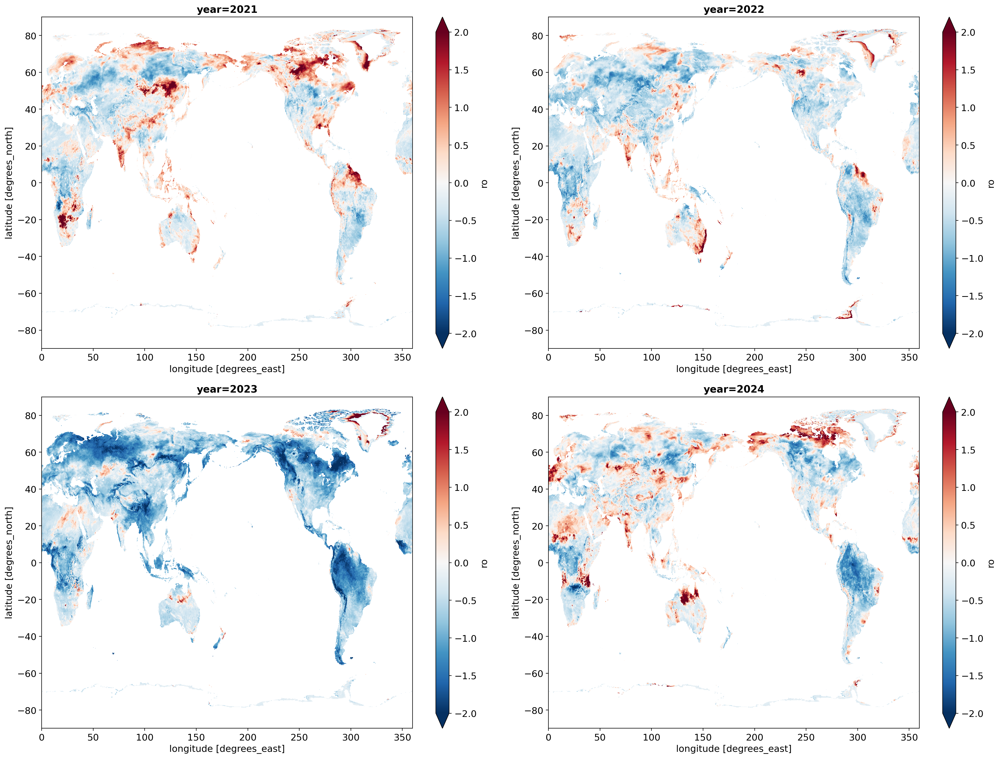

In [8]:
fig, axes = plt.subplots(figsize=(20,15),ncols=2,nrows=2)
vmin, vmax    = -2, 2
cmap = 'RdBu_r'
years = [2021, 2022, 2023, 2024]
for idx, (ax, year) in enumerate(zip(axes.flat, years)):
    plot_obj = roa_yearly.sel(year=year).plot(
        ax=ax,
        vmin=vmin,
        vmax=vmax,
        cmap=cmap,
        cbar_kwargs={'extend': 'both', 'aspect': 25}  
    )
    
    ax.set_title(f'year={year}', fontsize=14, fontweight='bold')
    #ax.coastlines()
plt.tight_layout()
plt.show()

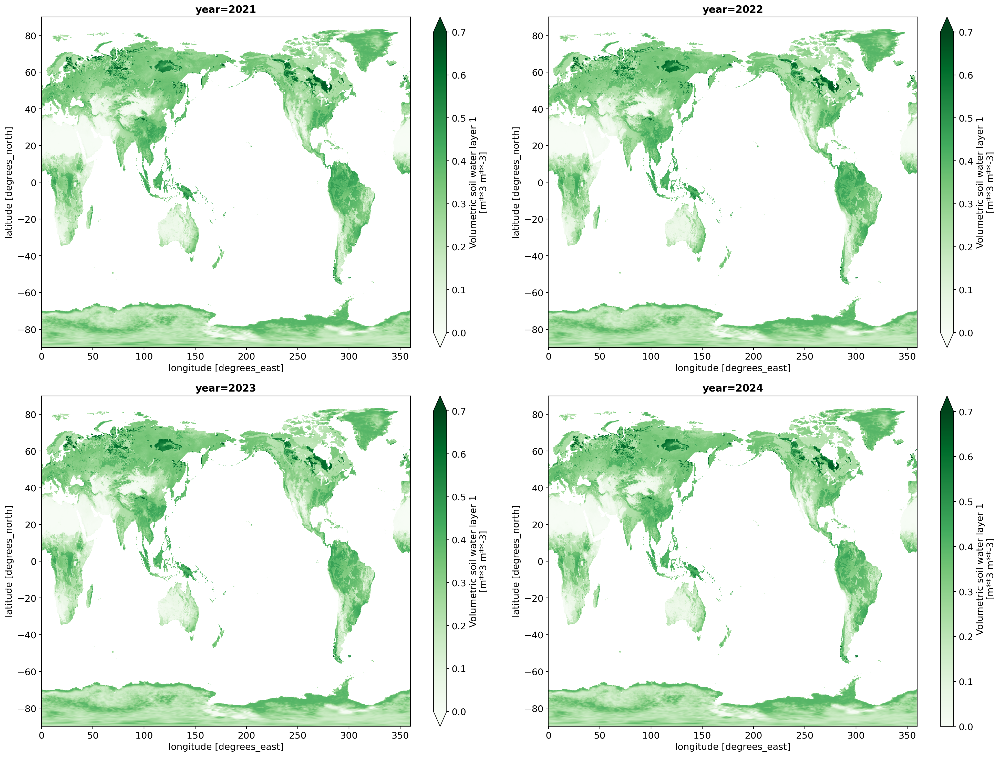

In [23]:
fig, axes = plt.subplots(figsize=(20,15),ncols=2,nrows=2)
vmin, vmax    = 0, 0.7
cmap = 'Greens'
years = [2021, 2022, 2023, 2024]
for idx, (ax, year) in enumerate(zip(axes.flat, years)):
    plot_obj = swvl1_yearly.swvl1.sel(year=year).plot(
        ax=ax,
        vmin=vmin,
        vmax=vmax,
        cmap=cmap,
        cbar_kwargs={'aspect': 25}  
    )
    
    ax.set_title(f'year={year}', fontsize=14, fontweight='bold')
    #ax.coastlines()
plt.tight_layout()
plt.show()

### Data preprocssing: set training & test sets

In [24]:
#downscaling
spatial_step = 5 
train_years = slice(1995, 2018)  # 1995-2018 as training set
test_years = slice(2019, 2024)   # 2019-2024 as testing set

tp_train = tp_yearly.sel(year=train_years).isel(
    latitude=slice(0, None, spatial_step),
    longitude=slice(0, None, spatial_step))
tp_test = tp_yearly.sel(year=test_years).isel(
    latitude=slice(0, None, spatial_step),
    longitude=slice(0, None, spatial_step))

evaow_train = evaow_yearly.sel(year=train_years).isel(
    latitude=slice(0, None, spatial_step),
    longitude=slice(0, None, spatial_step))
evaow_test = evaow_yearly.sel(year=test_years).isel(
    latitude=slice(0, None, spatial_step),
    longitude=slice(0, None, spatial_step))

swvl1_train = swvl1_yearly.sel(year=train_years).isel(
    latitude=slice(0, None, spatial_step),
    longitude=slice(0, None, spatial_step))
swvl1_test = swvl1_yearly.sel(year=test_years).isel(
    latitude=slice(0, None, spatial_step),
    longitude=slice(0, None, spatial_step))

roa_train = roa_yearly.sel(year=train_years).isel(
    latitude=slice(0, None, spatial_step),
    longitude=slice(0, None, spatial_step))
roa_test = roa_yearly.sel(year=test_years).isel(
    latitude=slice(0, None, spatial_step),
    longitude=slice(0, None, spatial_step))

print(f"train: {len(tp_train.year)}yr ({tp_train.year.values[0]}-{tp_train.year.values[-1]})")
print(f"test: {len(tp_test.year)}yr ({tp_test.year.values[0]}-{tp_test.year.values[-1]})")

train: 24yr (1995-2018)
test: 6yr (2019-2024)


In [25]:
# means, stds
tp_mean, tp_std = tp_train.mean(), tp_train.std()
evaow_mean, evaow_std = evaow_train.mean(), evaow_train.std()
swvl1_mean, swvl1_std = swvl1_train.mean(), swvl1_train.std()

# normalization
tp_train_norm = (tp_train - tp_mean) / tp_std
tp_test_norm = (tp_test - tp_mean) / tp_std

evaow_train_norm = (evaow_train - evaow_mean) / evaow_std
evaow_test_norm = (evaow_test - evaow_mean) / evaow_std

swvl1_train_norm = (swvl1_train - swvl1_mean) / swvl1_std
swvl1_test_norm = (swvl1_test - swvl1_mean) / swvl1_std

print("Complete!")

Complete!


In [26]:
roa_train

<xarray.DataArray 'ro' (year: 24, latitude: 180, longitude: 360)> Size: 6MB
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
...
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]],
      shape=(24, 180, 360), dtype=float32)
Coordinates:
  * year       (year) int64 192B 1995 1996 1997 1998 ... 2015 2016 2017 2018
  * latitude   (latitude) float64 1kB 89.95 88.95 87.95 ... -87.05 -88.05 -89.05
  * longitude  (longitude) float64 3kB 0.05 1.05 2.05 3.05 ... 357.1 358.1 359.1
    number     int64 8B ...

In [28]:
X_train_df = pd.DataFrame({
    "tp": tp_train_norm.stack({"samples": ("year", "latitude", "longitude")}).values,
    "evaow": evaow_train_norm.stack({"samples": ("year", "latitude", "longitude")}).values,
    "swvl1": swvl1_train_norm.stack({"samples": ("year", "latitude", "longitude")}).values
}, index=tp_train_norm.stack({"samples": ("year", "latitude", "longitude")}).coords['samples'].data)

X_test_df = pd.DataFrame({
    "tp": tp_test_norm.stack({"samples": ("year", "latitude", "longitude")}).values,
    "evaow": evaow_test_norm.stack({"samples": ("year", "latitude", "longitude")}).values,
    "swvl1": swvl1_test_norm.stack({"samples": ("year", "latitude", "longitude")}).values
}, index=tp_test_norm.stack({"samples": ("year", "latitude", "longitude")}).coords['samples'].data)


y_train_stacked = roa_train.stack({"samples": ("year", "latitude", "longitude")})
y_test_stacked = roa_test.stack({"samples": ("year", "latitude", "longitude")})

y_train_df = pd.DataFrame({
    "roa": y_train_stacked.values
}, index=y_train_stacked.coords['samples'].data)

y_test_df = pd.DataFrame({
    "roa": y_test_stacked.values
}, index=y_test_stacked.coords['samples'].data)

print("Complete!")
print(f"X_train_df: {X_train_df.shape}")
print(f"X_test_df: {X_test_df.shape}")
print(f"y_train_df: {y_train_df.shape}")
print(f"y_test_df: {y_test_df.shape}")

print(f"\n索引对齐检查:")
print(f"X_train和y_train索引一致: {X_train_df.index.equals(y_train_df.index)}")
print(f"X_test和y_test索引一致: {X_test_df.index.equals(y_test_df.index)}")

Complete!
X_train_df: (1555200, 3)
X_test_df: (388800, 3)
y_train_df: (1555200, 1)
y_test_df: (388800, 1)

索引对齐检查:
X_train和y_train索引一致: True
X_test和y_test索引一致: True


In [29]:
# to numpy
X_train = X_train_df.values
y_train = y_train_df.values.flatten()
X_test = X_test_df.values
y_test = y_test_df.values.flatten()
    
print(f"X_train: {X_train.shape}, y_train: {y_train.shape}")
print(f"X_test: {X_test.shape}, y_test: {y_test.shape}")

X_train: (1555200, 3), y_train: (1555200,)
X_test: (388800, 3), y_test: (388800,)


In [30]:
# 数据转换的最终安全方法
def safe_convert_to_numpy(df, name=""):
    """安全地将DataFrame转换为numpy数组"""
    try:
        # 方法1: 使用.values
        result = df.values
        print(f"{name} 使用.values转换成功")
        return result
    except Exception as e:
        print(f"{name} .values转换失败: {e}")
        
        try:
            # 方法2: 逐列转换
            columns = []
            for col in df.columns:
                col_data = pd.to_numeric(df[col], errors='coerce').fillna(0)
                columns.append(col_data.values)
            result = np.column_stack(columns)
            print(f"{name} 逐列转换成功")
            return result
        except Exception as e2:
            print(f"{name} 所有转换方法失败: {e2}")
            # 最后手段: 创建零数组
            result = np.zeros((len(df), len(df.columns)))
            print(f"{name} 使用零数组备用")
            return result

# 安全转换所有数据
print("安全转换为numpy数组...")
X_train = safe_convert_to_numpy(X_train_df, "X_train")
X_test = safe_convert_to_numpy(X_test_df, "X_test")

# 对于y数据，确保是一维的
y_train = safe_convert_to_numpy(y_train_df, "y_train").flatten()
y_test = safe_convert_to_numpy(y_test_df, "y_test").flatten()

print(f"\n最终numpy数组形状:")
print(f"X_train: {X_train.shape}, y_train: {y_train.shape}")
print(f"X_test: {X_test.shape}, y_test: {y_test.shape}")

安全转换为numpy数组...
X_train 使用.values转换成功
X_test 使用.values转换成功
y_train 使用.values转换成功
y_test 使用.values转换成功

最终numpy数组形状:
X_train: (1555200, 3), y_train: (1555200,)
X_test: (388800, 3), y_test: (388800,)


In [73]:
# 首先检查原始xarray数据
print("检查原始xarray数据:")
print(f"tp_train_norm类型: {type(tp_train_norm)}")
print(f"tp_train_norm.values类型: {type(tp_train_norm.values)}")

# 检查堆叠后的数据
tp_stacked = tp_train_norm.stack({"samples": ("year", "latitude", "longitude")})
print(f"tp_stacked类型: {type(tp_stacked)}")
print(f"tp_stacked.values类型: {type(tp_stacked.values)}")

# 检查是否有方法对象
def check_for_methods(arr, name):
    """检查数组中是否包含方法对象"""
    if hasattr(arr, 'flat'):
        for i, val in enumerate(arr.flat):
            if callable(val):
                print(f"在 {name} 中发现方法对象，位置 {i}: {val}")
                return True
    return False

# 检查各个数据源
print("\n检查方法对象:")
check_for_methods(tp_train_norm.values, "tp_train_norm")
check_for_methods(evaow_train_norm.values, "evaow_train_norm") 
check_for_methods(swvl1_train_norm.values, "swvl1_train_norm")
check_for_methods(roa_train.values, "roa_train")

检查原始xarray数据:
tp_train_norm类型: <class 'xarray.core.dataset.Dataset'>
tp_train_norm.values类型: <class 'method'>
tp_stacked类型: <class 'xarray.core.dataset.Dataset'>
tp_stacked.values类型: <class 'method'>

检查方法对象:


False

In [32]:
tp_train_da = tp_train_norm['tp']
evaow_train_da = evaow_train_norm['evaow'] 
swvl1_train_da = swvl1_train_norm['swvl1']

tp_test_da = tp_test_norm['tp']
evaow_test_da = evaow_test_norm['evaow']
swvl1_test_da = swvl1_test_norm['swvl1']

# 使用DataArray重新创建DataFrame
X_train_df = pd.DataFrame({
    "tp": tp_train_da.stack({"samples": ("year", "latitude", "longitude")}).values,
    "evaow": evaow_train_da.stack({"samples": ("year", "latitude", "longitude")}).values,
    "swvl1": swvl1_train_da.stack({"samples": ("year", "latitude", "longitude")}).values
}, index=tp_train_da.stack({"samples": ("year", "latitude", "longitude")}).coords['samples'].data)

X_test_df = pd.DataFrame({
    "tp": tp_test_da.stack({"samples": ("year", "latitude", "longitude")}).values,
    "evaow": evaow_test_da.stack({"samples": ("year", "latitude", "longitude")}).values,
    "swvl1": swvl1_test_da.stack({"samples": ("year", "latitude", "longitude")}).values
}, index=tp_test_da.stack({"samples": ("year", "latitude", "longitude")}).coords['samples'].data)

# 同样检查roa的数据类型
print(f"roa_train类型: {type(roa_train)}")
if isinstance(roa_train, xr.Dataset):
    roa_train_da = roa_train[list(roa_train.data_vars)[0]]
else:
    roa_train_da = roa_train

if isinstance(roa_test, xr.Dataset):
    roa_test_da = roa_test[list(roa_test.data_vars)[0]]
else:
    roa_test_da = roa_test


# 创建y的DataFrame
y_train_df = pd.DataFrame({
    "roa": roa_train_da.stack({"samples": ("year", "latitude", "longitude")}).values
}, index=roa_train_da.stack({"samples": ("year", "latitude", "longitude")}).coords['samples'].data)

y_test_df = pd.DataFrame({
    "roa": roa_test_da.stack({"samples": ("year", "latitude", "longitude")}).values
}, index=roa_test_da.stack({"samples": ("year", "latitude", "longitude")}).coords['samples'].data)


print("Complete!")
print(f"X_train_df: {X_train_df.shape}")
print(f"X_test_df: {X_test_df.shape}")
print(f"y_train_df: {y_train_df.shape}")
print(f"y_test_df: {y_test_df.shape}")

roa_train类型: <class 'xarray.core.dataarray.DataArray'>
Complete!
X_train_df: (1555200, 3)
X_test_df: (388800, 3)
y_train_df: (1555200, 1)
y_test_df: (388800, 1)


In [33]:
#convert to dataframe
X_train_df = pd.DataFrame({
    "tp": tp_train_norm.stack({"samples": ("year", "latitude", "longitude")}).values,
    "evaow": evaow_train_norm.stack({"samples": ("year", "latitude", "longitude")}).values,
    "swvl1": swvl1_train_norm.stack({"samples": ("year", "latitude", "longitude")}).values
}, index=tp_train_norm.stack({"samples": ("year", "latitude", "longitude")}).coords['samples'].data)

X_test_df = pd.DataFrame({
    "tp": tp_test_norm.stack({"samples": ("year", "latitude", "longitude")}).values,
    "evaow": evaow_test_norm.stack({"samples": ("year", "latitude", "longitude")}).values,
    "swvl1": swvl1_test_norm.stack({"samples": ("year", "latitude", "longitude")}).values
}, index=tp_test_norm.stack({"samples": ("year", "latitude", "longitude")}).coords['samples'].data)

y_train_df = pd.DataFrame({
    "roa": roa_train.stack({"samples": ("year", "latitude", "longitude")}).values
}, index=roa_train.stack({"samples": ("year", "latitude", "longitude")}).coords['samples'].data)

y_test_df = pd.DataFrame({
    "roa": roa_test.stack({"samples": ("year", "latitude", "longitude")}).values
}, index=roa_test.stack({"samples": ("year", "latitude", "longitude")}).coords['samples'].data)

print("Complete!")
print(f"X_train_df: {X_train_df.shape}")
print(f"X_test_df: {X_test_df.shape}")
print(f"y_train_df: {y_train_df.shape}")
print(f"y_test_df: {y_test_df.shape}")

Complete!
X_train_df: (1555200, 3)
X_test_df: (388800, 3)
y_train_df: (1555200, 1)
y_test_df: (388800, 1)


In [34]:
# 数据转换的最终安全方法
def safe_convert_to_numpy(df, name=""):
    """安全地将DataFrame转换为numpy数组"""
    try:
        # 方法1: 使用.values
        result = df.values
        print(f"{name} 使用.values转换成功")
        return result
    except Exception as e:
        print(f"{name} .values转换失败: {e}")
        
        try:
            # 方法2: 逐列转换
            columns = []
            for col in df.columns:
                col_data = pd.to_numeric(df[col], errors='coerce').fillna(0)
                columns.append(col_data.values)
            result = np.column_stack(columns)
            print(f"{name} 逐列转换成功")
            return result
        except Exception as e2:
            print(f"{name} 所有转换方法失败: {e2}")
            # 最后手段: 创建零数组
            result = np.zeros((len(df), len(df.columns)))
            print(f"{name} 使用零数组备用")
            return result

# 安全转换所有数据
print("安全转换为numpy数组...")
X_train = safe_convert_to_numpy(X_train_df, "X_train")
X_test = safe_convert_to_numpy(X_test_df, "X_test")

# 对于y数据，确保是一维的
y_train = safe_convert_to_numpy(y_train_df, "y_train").flatten()
y_test = safe_convert_to_numpy(y_test_df, "y_test").flatten()

print(f"\n最终numpy数组形状:")
print(f"X_train: {X_train.shape}, y_train: {y_train.shape}")
print(f"X_test: {X_test.shape}, y_test: {y_test.shape}")

安全转换为numpy数组...
X_train 使用.values转换成功
X_test 使用.values转换成功
y_train 使用.values转换成功
y_test 使用.values转换成功

最终numpy数组形状:
X_train: (1555200, 3), y_train: (1555200,)
X_test: (388800, 3), y_test: (388800,)


In [35]:
# 检查缺失值的数量和位置
print("缺失值统计:")
print(f"y_train NaN数量: {np.isnan(y_train).sum()} / {len(y_train)}")
print(f"y_test NaN数量: {np.isnan(y_test).sum()} / {len(y_test)}")

print(f"X_train NaN数量: {np.isnan(X_train).sum()} / {X_train.size}")
print(f"X_test NaN数量: {np.isnan(X_test).sum()} / {X_test.size}")

# 检查缺失值比例
y_train_nan_ratio = np.isnan(y_train).sum() / len(y_train)
y_test_nan_ratio = np.isnan(y_test).sum() / len(y_test)

print(f"y_train NaN比例: {y_train_nan_ratio:.4f}")
print(f"y_test NaN比例: {y_test_nan_ratio:.4f}")

# 如果缺失值比例很高，需要检查原始数据
if y_train_nan_ratio > 0.1:
    print("警告: y_train中缺失值比例超过10%，可能需要检查原始数据")

缺失值统计:
y_train NaN数量: 1176696 / 1555200
y_test NaN数量: 294174 / 388800


TypeError: ufunc 'isnan' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''

In [36]:
# 策略1：将NaN视为零径流（物理上合理）
print("\n采用策略1: 将NaN视为零径流")

def treat_nan_as_zero(X, y, name=""):
    """将y中的NaN视为零径流，同时确保对应的X数据有效"""
    y_filled = y.copy()
    nan_mask = np.isnan(y)
    
    # 将y中的NaN替换为0
    y_filled[nan_mask] = 0.0
    print(f"{name}: 将 {nan_mask.sum()} 个NaN值替换为0")
    
    # 检查对应的X数据是否有问题
    if nan_mask.any():
        x_nan_count = np.isnan(X[nan_mask]).sum()
        if x_nan_count > 0:
            print(f"  警告: 在零径流区域，X中有 {x_nan_count} 个NaN值")
            # 对于这些区域，使用特征的平均值填充
            for i in range(X.shape[1]):
                col_nan_mask = np.isnan(X[:, i])
                if col_nan_mask.any():
                    col_mean = np.nanmean(X[:, i])
                    X[col_nan_mask, i] = col_mean
    
    return X, y_filled

# 应用处理
X_train_zero, y_train_zero = treat_nan_as_zero(X_train, y_train, "Training")
X_test_zero, y_test_zero = treat_nan_as_zero(X_test, y_test, "Testing")


采用策略1: 将NaN视为零径流
Training: 将 1176696 个NaN值替换为0


TypeError: ufunc 'isnan' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''

### Build & train the RF model

#### Option 1: randomly select a hyperparameter setting

In [123]:
n_estimators      = 300    # Number of trees in random forest
min_samples_split = 2     # Minimum number of samples required to split a node
min_samples_leaf  = 1      # Minimum number of samples required at each leaf node
max_features      = None   # Number of features to consider at every split: 'sqrt', 'log2', or None.
                           # None: max_features=n_feature
max_depth         = 30    # Maximum number of levels in tree
bootstrap         = True   # Method of selecting samples for training each tree

reg0 = RandomForestRegressor(n_estimators=n_estimators,
                             min_samples_split=min_samples_split,
                             min_samples_leaf=min_samples_leaf,
                             max_features=max_features,
                             max_depth=max_depth,
                             bootstrap=bootstrap)

rf_roa = reg0.fit(X_train_zero,y_train_zero)

In [124]:
y_test_pre = rf_roa.predict(X_test_zero)

### Evaluate the model

In [112]:
y_test_zero = y_test_zero.reshape(5, 180, 360)

y_test_zero = xr.Dataset(coords={'year': roa_pre.year.values, 
                               'latitude': roa_pre.latitude.values, 
                               'longitude': roa_pre.longitude.values},
                        data_vars=dict(roa=(['year', 'latitude', 'longitude'], y_test_zero)))

AttributeError: 'Dataset' object has no attribute 'reshape'

In [125]:
y_test_pre.shape

(324000,)

In [126]:
y_test_pre = y_test_pre.reshape(5, 180, 360)

y_test_pre = xr.Dataset(coords={'year': roa_pre.year.values, 
                               'latitude': roa_pre.latitude.values, 
                               'longitude': roa_pre.longitude.values},
                        data_vars=dict(roa=(['year', 'latitude', 'longitude'], y_test_pre)))

In [127]:
y_test_pre

<xarray.Dataset> Size: 3MB
Dimensions:    (year: 5, latitude: 180, longitude: 360)
Coordinates:
  * year       (year) int64 40B 2020 2021 2022 2023 2024
  * latitude   (latitude) float64 1kB 89.95 88.95 87.95 ... -87.05 -88.05 -89.05
  * longitude  (longitude) float64 3kB 0.05 1.05 2.05 3.05 ... 357.1 358.1 359.1
Data variables:
    roa        (year, latitude, longitude) float64 3MB -4.766e-06 ... 1.37e-05

In [128]:
y_test_zero

<xarray.Dataset> Size: 1MB
Dimensions:    (year: 5, latitude: 180, longitude: 360)
Coordinates:
  * year       (year) int64 40B 2020 2021 2022 2023 2024
  * latitude   (latitude) float64 1kB 89.95 88.95 87.95 ... -87.05 -88.05 -89.05
  * longitude  (longitude) float64 3kB 0.05 1.05 2.05 3.05 ... 357.1 358.1 359.1
Data variables:
    roa        (year, latitude, longitude) float32 1MB 0.0 0.0 0.0 ... 0.0 0.0

In [129]:
from sklearn.metrics import mean_squared_error
import numpy as np

# 确保y_test_zero和y_test_pre的形状一致
# 如果y_test是三维的，需要先展平为二维
y_test_zero_flat = y_test_zero.roa.values.reshape(y_test_zero.roa.shape[0], -1)
y_test_pre_flat = y_test_pre.roa.values.reshape(y_test_pre.roa.shape[0], -1)

# 计算RMSE
rmse = np.sqrt(mean_squared_error(y_test_zero_flat, y_test_pre_flat))
print(f"Test RMSE: {rmse}")

Test RMSE: 0.2661995898120967


In [130]:
roa_pre

<xarray.DataArray 'ro' (year: 5, latitude: 180, longitude: 360)> Size: 1MB
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]],
      shape=(5, 180, 360), dtype=float32)
Coordinates:
  * year       (year) int64 40B 2020 2021 2022 2023 2024
  * latitude   (latitude) float64 1kB 89.95 88.95 87.95 ... -87.05 -88.05 -89.05
  * longitude  (longitude) float64 3kB 0.05 1.05 2.05 3.05 ... 357.1 358.1 359.1
    number     int64 8B ...

In [1]:
fig, axes = plt.subplots(figsize=(15,12),ncols=2,nrows=3)

yrs = [2022, 2023, 2024]
#vmin, vmax    = -6, 6
cmap = 'RdBu_r'
y_test_pre.roa.sel(year=yrs[0]).plot(ax=axes[0,0], vmin=vmin, vmax=vmax,cmap=cmap)
y_test_zero.roa.sel(year=yrs[0]).plot(ax=axes[0,1], vmin=vmin, vmax=vmax,cmap=cmap)

y_test_pre.roa.sel(year=yrs[1]).plot(ax=axes[1,0], vmin=vmin, vmax=vmax,cmap=cmap)
y_test_zero.roa.sel(year=yrs[1]).plot(ax=axes[1,1], vmin=vmin, vmax=vmax,cmap=cmap)

y_test_pre.roa.sel(year=yrs[2]).plot(ax=axes[2,0], vmin=vmin, vmax=vmax,cmap=cmap)
y_test_zero.roa.sel(year=yrs[2]).plot(ax=axes[2,1], vmin=vmin, vmax=vmax,cmap=cmap)


for i, ax in enumerate(axes.flat):
    # left column: model prediction
    if i % 2 == 0:
        ax.set_title(f'ROA model prediction (year = {yrs[i//2]})',fontweight='bold')
    # right column: observation
    else:
        ax.set_title(f'ROA truth (year = {yrs[i//2]})',fontweight='bold')
plt.tight_layout()

NameError: name 'plt' is not defined

#### Option 2: use **cross validation** to find the optimum hyperparameter setting

In [137]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 300, num = 5)]

# Number of features to consider at every split
max_features = ['sqrt', 'log2', None]

# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(5,55, num = 11)]
max_depth.append(None)

# Minimum number of samples required to split a node
min_samples_split = [5, 10, 15, 25]

# Minimum number of samples required at each leaf node
min_samples_leaf = [4, 8, 12,16]

# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

In [138]:
print(random_grid)

{'n_estimators': [100, 150, 200, 250, 300], 'max_features': ['sqrt', 'log2', None], 'max_depth': [5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, None], 'min_samples_split': [5, 10, 15, 25], 'min_samples_leaf': [4, 8, 12, 16], 'bootstrap': [True, False]}


In [139]:
reg0 = RandomForestRegressor(random_state=0)
# perform cross validation
rf_random0 = RandomizedSearchCV(estimator = reg0, param_distributions = random_grid, 
                                n_iter = 5, cv = 3, verbose=2, n_jobs = -1)
rf_roa_cv = rf_random0.fit(X_train_zero,y_train_zero)

print("The best hyperparameters: \n",rf_roa_cv.best_params_)

Fitting 3 folds for each of 5 candidates, totalling 15 fits
[CV] END bootstrap=True, max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=25, n_estimators=150; total time= 1.7min
[CV] END bootstrap=False, max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=15, n_estimators=150; total time= 5.7min
[CV] END bootstrap=True, max_depth=55, max_features=sqrt, min_samples_leaf=12, min_samples_split=5, n_estimators=300; total time= 2.9min
The best hyperparameters: 
 {'n_estimators': 200, 'min_samples_split': 25, 'min_samples_leaf': 16, 'max_features': 'log2', 'max_depth': 15, 'bootstrap': True}
[CV] END bootstrap=True, max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=25, n_estimators=150; total time= 1.7min
[CV] END bootstrap=False, max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=15, n_estimators=150; total time= 7.2min
[CV] END bootstrap=False, max_depth=40, max_features=None, min_samples_leaf=4, min_samples_spl

In [140]:
y_test_pre_cv = rf_roa_cv.predict(X_test_zero)
y_test_pre_cv = y_test_pre_cv.reshape(5, 180, 360)

y_test_pre_cv = xr.Dataset(coords={'year': roa_pre.year.values, 
                               'latitude': roa_pre.latitude.values, 
                               'longitude': roa_pre.longitude.values},
                        data_vars=dict(roa=(['year', 'latitude', 'longitude'], y_test_pre_cv)))

In [141]:
from sklearn.metrics import mean_squared_error
import numpy as np

# 确保y_test_zero和y_test_pre的形状一致
# 如果y_test是三维的，需要先展平为二维
y_test_zero_flat = y_test_zero.roa.values.reshape(y_test_zero.roa.shape[0], -1)
y_test_pre_flat_cv = y_test_pre_cv.roa.values.reshape(y_test_pre_cv.roa.shape[0], -1)

# 计算RMSE
rmse = np.sqrt(mean_squared_error(y_test_zero_flat, y_test_pre_flat_cv))
print(f"Test RMSE: {rmse}")

Test RMSE: 0.25888142807800424


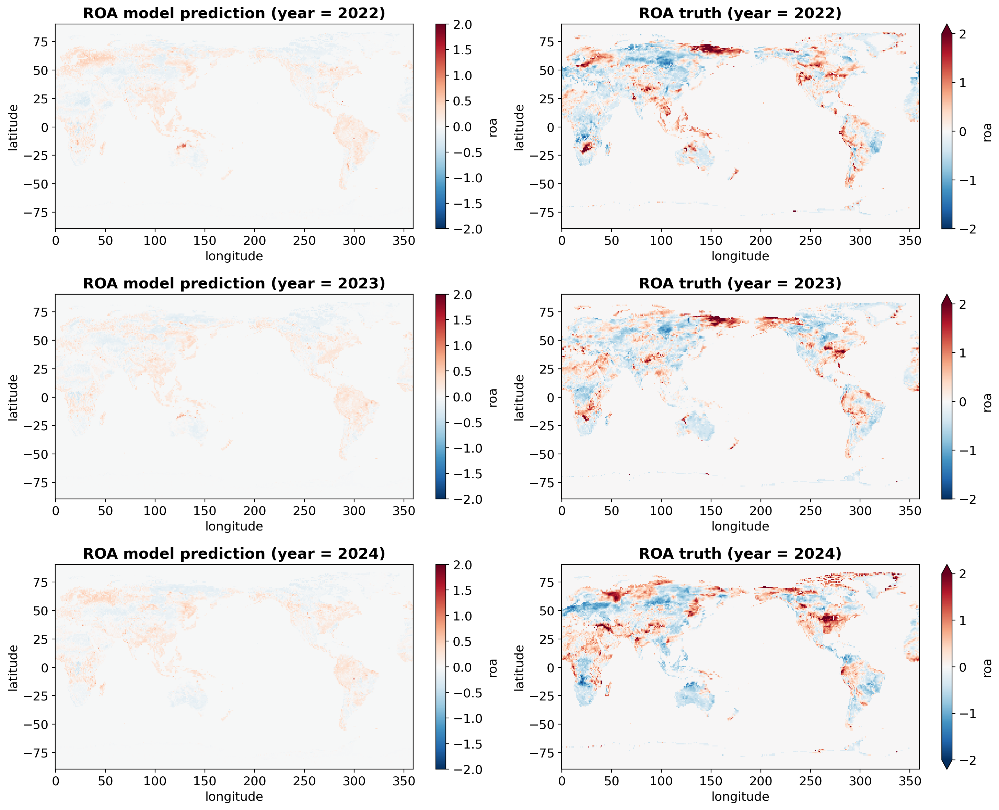

In [153]:
fig, axes = plt.subplots(figsize=(15,12),ncols=2,nrows=3)

yrs = [2022, 2023, 2024]
vmin, vmax    = -2, 2
cmap = 'RdBu_r'
y_test_pre_cv.roa.sel(year=yrs[0]).plot(ax=axes[0,0], vmin=vmin, vmax=vmax,cmap=cmap)
y_test_zero.roa.sel(year=yrs[0]).plot(ax=axes[0,1], vmin=vmin, vmax=vmax,cmap=cmap)

y_test_pre_cv.roa.sel(year=yrs[1]).plot(ax=axes[1,0], vmin=vmin, vmax=vmax,cmap=cmap)
y_test_zero.roa.sel(year=yrs[1]).plot(ax=axes[1,1], vmin=vmin, vmax=vmax,cmap=cmap)

y_test_pre_cv.roa.sel(year=yrs[2]).plot(ax=axes[2,0], vmin=vmin, vmax=vmax,cmap=cmap)
y_test_zero.roa.sel(year=yrs[2]).plot(ax=axes[2,1], vmin=vmin, vmax=vmax,cmap=cmap)


for i, ax in enumerate(axes.flat):
    # left column: model prediction
    if i % 2 == 0:
        ax.set_title(f'ROA model prediction (year = {yrs[i//2]})',fontweight='bold')
    # right column: observation
    else:
        ax.set_title(f'ROA truth (year = {yrs[i//2]})',fontweight='bold')
plt.tight_layout()

### Gradient boosting

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

gbr_extreme = GradientBoostingRegressor(
    # parameters
    n_estimators=500,           
    max_depth=10,               
    learning_rate=0.05,         
    
    # extreme
    subsample=0.7,              
    max_features='sqrt',        
    min_samples_split=20,       
    min_samples_leaf=10,        
    
    
    loss='squared_error',       
    # loss='absolute_error',    
    
    random_state=42,
    verbose=1
)

gbr_roa = gbr_extreme.fit(X_train_zero, y_train_zero)

y_test_pre_gbr = gbr_extreme.predict(X_test_zero)
y_train_pre_gbr = gbr_extreme.predict(X_train_zero)

训练专门针对极端径流的梯度提升模型...
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.0729           0.0005            5.26m
         2           0.0724           0.0005            5.13m
         3           0.0716          -0.0001            5.44m
         4           0.0714           0.0008            5.49m
         5           0.0709           0.0001            5.61m
         6           0.0701          -0.0004            5.59m
         7           0.0699           0.0006            5.53m
         8           0.0700           0.0013            5.44m
         9           0.0695           0.0000            5.43m
        10           0.0690          -0.0004            5.39m
        20           0.0673          -0.0001            5.27m
        30           0.0659          -0.0002            5.11m
        40           0.0651           0.0003            5.04m
        50           0.0649           0.0004            5.00m
        60           0.0646          -0.0003    

In [145]:
y_test_pre_gbr

array([ 2.29337013e-05,  2.29337013e-05,  2.29337013e-05, ...,
       -1.10442803e-04, -1.10442803e-04, -1.10442803e-04], shape=(324000,))

In [146]:
y_test_pre_gbr = y_test_pre_gbr.reshape(5, 180, 360)

y_test_pre_gbr = xr.Dataset(coords={'year': roa_pre.year.values, 
                               'latitude': roa_pre.latitude.values, 
                               'longitude': roa_pre.longitude.values},
                        data_vars=dict(roa=(['year', 'latitude', 'longitude'], y_test_pre_gbr)))

In [147]:
from sklearn.metrics import mean_squared_error
import numpy as np

# 确保y_test_zero和y_test_pre的形状一致
# 如果y_test是三维的，需要先展平为二维
y_test_zero_flat = y_test_zero.roa.values.reshape(y_test_zero.roa.shape[0], -1)
y_test_pre_flat_gbr = y_test_pre_gbr.roa.values.reshape(y_test_pre_cv.roa.shape[0], -1)

# 计算RMSE
rmse = np.sqrt(mean_squared_error(y_test_zero_flat, y_test_pre_flat_gbr))
print(f"Test RMSE: {rmse}")

Test RMSE: 0.2594777491729846


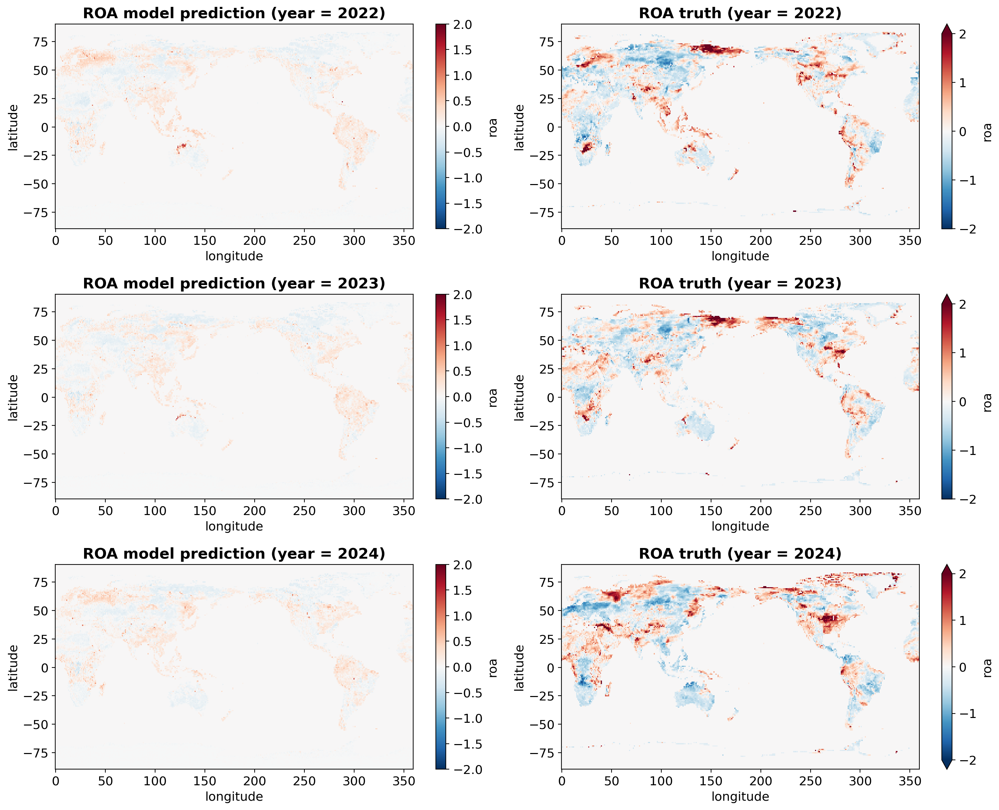

In [152]:
fig, axes = plt.subplots(figsize=(15,12),ncols=2,nrows=3)

yrs = [2022, 2023, 2024]
vmin, vmax    = -2, 2
cmap = 'RdBu_r'
y_test_pre_gbr.roa.sel(year=yrs[0]).plot(ax=axes[0,0], vmin=vmin, vmax=vmax,cmap=cmap)
y_test_zero.roa.sel(year=yrs[0]).plot(ax=axes[0,1], vmin=vmin, vmax=vmax,cmap=cmap)

y_test_pre_gbr.roa.sel(year=yrs[1]).plot(ax=axes[1,0], vmin=vmin, vmax=vmax,cmap=cmap)
y_test_zero.roa.sel(year=yrs[1]).plot(ax=axes[1,1], vmin=vmin, vmax=vmax,cmap=cmap)

y_test_pre_gbr.roa.sel(year=yrs[2]).plot(ax=axes[2,0], vmin=vmin, vmax=vmax,cmap=cmap)
y_test_zero.roa.sel(year=yrs[2]).plot(ax=axes[2,1], vmin=vmin, vmax=vmax,cmap=cmap)


for i, ax in enumerate(axes.flat):
    # left column: model prediction
    if i % 2 == 0:
        ax.set_title(f'ROA model prediction (year = {yrs[i//2]})',fontweight='bold')
    # right column: observation
    else:
        ax.set_title(f'ROA truth (year = {yrs[i//2]})',fontweight='bold')
plt.tight_layout()